# G211.59
Trey V. Wenger - December 2024

In [1]:
# General imports    
import os
import pickle
import time

import matplotlib.pyplot as plt
import arviz as az
import pandas as pd
import numpy as np
import pymc as pm

print("pymc version:", pm.__version__)

import bayes_spec
print("bayes_spec version:", bayes_spec.__version__)

import bayes_cn_hfs
print("bayes_cn_hfs version:", bayes_cn_hfs.__version__)

# Notebook configuration
pd.options.display.max_rows = None

pymc version: 5.19.1
bayes_spec version: 1.7.2
bayes_cn_hfs version: 1.0.2+6.ge3576a9.dirty


## Load the data

rms 12CN 0.003989581846282774
rms 13CN 0.00309284883050714
12CN-1 600
12CN-2 499
13CN 371


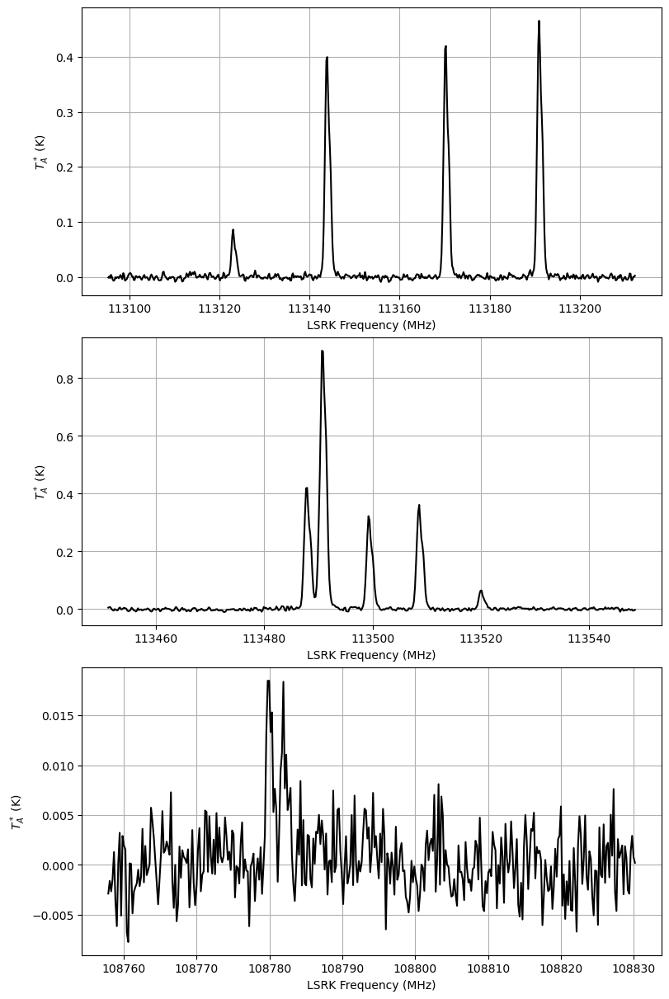

In [2]:
from bayes_spec import SpecData

data_12CN = np.genfromtxt("12CN_13CN_spectra/12CN_G211.59_freq.dat")
data_13CN = np.genfromtxt("12CN_13CN_spectra/13CN_G211.59_freq.dat")

# estimate noise
noise_12CN = 1.4826 * np.median(np.abs(data_12CN[:, 1] - np.median(data_12CN[:, 1])))
print("rms 12CN", noise_12CN)
noise_13CN = 1.4826 * np.median(np.abs(data_13CN[:, 1] - np.median(data_13CN[:, 1])))
print("rms 13CN", noise_13CN)

obs_12CN_1 = SpecData(
    data_12CN[0:600, 0],
    data_12CN[0:600, 1],
    noise_12CN,
    xlabel=r"LSRK Frequency (MHz)",
    ylabel=r"$T_A^*$ (K)",
)
obs_12CN_2 = SpecData(
    data_12CN[-500:-1, 0],
    data_12CN[-500:-1, 1],
    noise_12CN,
    xlabel=r"LSRK Frequency (MHz)",
    ylabel=r"$T_A^*$ (K)",
)
obs_13CN = SpecData(
    data_13CN[:, 0],
    data_13CN[:, 1],
    noise_13CN,
    xlabel=r"LSRK Frequency (MHz)",
    ylabel=r"$T_A^*$ (K)",
)
data = {"12CN-1": obs_12CN_1, "12CN-2": obs_12CN_2, "13CN": obs_13CN}
for label, dataset in data.items():
    print(label, len(dataset.spectral))
    # HACK: normalize data by noise
    dataset._brightness_offset = np.median(dataset.brightness)
    dataset._brightness_scale = dataset.noise

# subset of 12CN data
data_12CN = {
    label: data[label]
    for label in data.keys() if "12CN" in label
}

# Plot the data
fig, axes = plt.subplots(len(data), layout="constrained", figsize=(8, 12))
for i, label in enumerate(data.keys()):
    axes[i].plot(data[label].spectral, data[label].brightness, 'k-')
    axes[i].set_xlabel(data[label].xlabel)
    axes[i].set_ylabel(data[label].ylabel)

## Reproduce Sun et al. (2024) model

In [5]:
import astropy.units as u
import astropy.constants as c
from bayes_cn_hfs import get_molecule_data
from bayes_cn_hfs.utils import supplement_mol_data

mol_data_12CN, weight_12CN = supplement_mol_data("CN")
print(mol_data_12CN)

sun2024_tau_ml = 0.86
sun2024_Tex = 4.61*u.K
freq = 113.5*u.GHz

# main line upper state column density
sun2024_Nu_ml = 8.0*np.pi*freq**2.0 / c.c**2.0 / (np.exp(c.h*freq/(c.k_B*sun2024_Tex)) - 1.0) / (mol_data_12CN["Aul"][5]/u.s) / (1.0/u.MHz) * sun2024_tau_ml
print("main line log10 upper column density", np.log10(sun2024_Nu_ml.to('cm-2').value))

# ground state column density
gL = 4.0 # ground state degeneracy
Nground = sun2024_Nu_ml * gL / mol_data_12CN["degu"][5] * np.exp(mol_data_12CN["Eu"][5]*u.erg/(c.k_B*sun2024_Tex))
print("log10 ground state column density", np.log10(Nground.to("cm-2").value))

{'freq': array([113123.3687, 113144.19  , 113170.535 , 113191.325 , 113488.142 ,
       113490.985 , 113499.643 , 113508.934 , 113520.4215]), 'Aul': array([1.26969616e-06, 1.03939111e-05, 5.07869910e-06, 6.59525390e-06,
       6.64784064e-06, 1.17706070e-05, 1.04919208e-05, 5.12459350e-06,
       1.28243028e-06]), 'degu': array([2, 2, 4, 4, 4, 6, 2, 4, 2]), 'El': array([1.3905121e-19, 0.0000000e+00, 1.3905121e-19, 0.0000000e+00,
       1.3905121e-19, 0.0000000e+00, 1.3905121e-19, 0.0000000e+00,
       0.0000000e+00]), 'Eu': array([7.49702428e-16, 7.49701340e-16, 7.50014955e-16, 7.50013660e-16,
       7.52119441e-16, 7.51999228e-16, 7.52195648e-16, 7.52118159e-16,
       7.52194276e-16]), 'relative_int': array([0.01204699, 0.09860036, 0.09633376, 0.1250773 , 0.12574146,
       0.33394774, 0.09921527, 0.09691221, 0.01212491]), 'log10_Q_terms': array([0.40307694, 0.97433601]), 'Qu': ['1 0 1 1', '1 0 1 1', '1 0 1 2', '1 0 1 2', '1 0 2 2', '1 0 2 3', '1 0 2 1', '1 0 2 2', '1 0 2 1'], 'Ql': 

Transition 113144.19 is constraining upper state 1 from lower state 0
Transition 113191.325 is constraining upper state 2 from lower state 0
Transition 113490.985 is constraining upper state 4 from lower state 0
Transition 113508.934 is constraining upper state 0 from lower state 0
Transition 113520.4215 is constraining upper state 3 from lower state 0
Transition 113123.3687 is constraining lower state 1 from upper state 1
6/9 transitions used to constrain state densities
Free Tex transitions: [113123.3687 113144.19   113191.325  113490.985  113508.934  113520.4215]
Derived Tex transitions: [113170.535 113488.142 113499.643]

Tex:
[[4.61]
 [4.61]
 [4.61]
 [4.61]
 [4.61]
 [4.61]
 [4.61]
 [4.61]
 [4.61]]

tau:
[[0.03106523]
 [0.25429038]
 [0.24836476]
 [0.32251169]
 [0.32375837]
 [0.86002019]
 [0.25544675]
 [0.24956088]
 [0.03122166]]

tau_total:
[2.57623988]

TR:
[[2.4163491 ]
 [2.41603698]
 [2.4156421 ]
 [2.41533052]
 [2.41088554]
 [2.410843  ]
 [2.41071344]
 [2.41057441]
 [2.41040252]

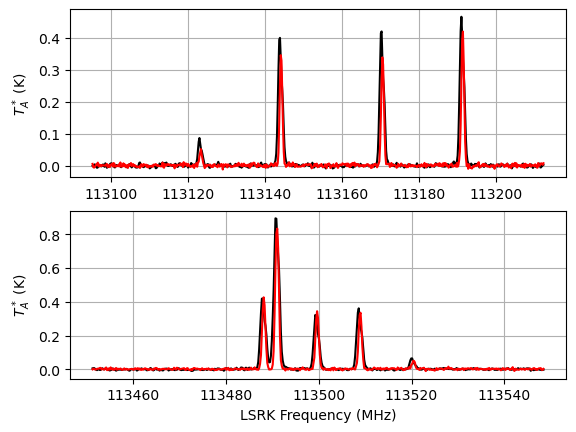

In [39]:
from bayes_cn_hfs.cn_model import CNModel

# Initialize and define the model
baseline_degree = 0
n_clouds = 1
model = CNModel(
    data_12CN,
    molecule="CN", # molecule (either "CN" or "13CN")
    mol_data=mol_data_12CN, # molecular data
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=0.78, # Main beam efficiency
    Feff=0.94, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N0 = [12.5, 0.5], # mean and width of log10 ground state column density prior (cm-2)
    prior_log10_Tkin = [1.5, 0.5], # mean and width of log10 kinetic temperature prior (K)
    prior_velocity = [0.0, 5.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = 1.0, # width of latent Lorentzian FWHM prior (km/s)
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = True, # assume LTE
    prior_log10_Tex = None, # ignored for this LTE+CTEX model
    assume_CTEX = True, # ignored for this LTE+CTEX model
    prior_log10_inv_boltz_factor = 5.0, # ignored for this LTE+CTEX model
    fix_log10_Tkin = None, # do not fix kinetic temperature for this LTE model
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

# Simulate with Sun et al. (2024) parameters
# FWHM is unknown, we pick 2 km/s because it looks good
sim_params = {
    "log10_N0": [np.log10(Nground.to("cm-2").value)],
    "log10_Tkin": [np.log10(sun2024_Tex.to("K").value)],
    "fwhm_nonthermal": [2.0],
    "velocity": [0.0],
    "fwhm_L": 0.0,
    "baseline_12CN-1_norm": [0.0],
    "baseline_12CN-2_norm": [0.0],
}
sim_obs1 = model.model["12CN-1"].eval(sim_params, on_unused_input="ignore")
sim_obs2 = model.model["12CN-2"].eval(sim_params, on_unused_input="ignore")

Tex = model.model.Tex.eval(sim_params, on_unused_input="ignore")
tau = model.model.tau.eval(sim_params, on_unused_input="ignore")
tau_total = model.model.tau_total.eval(sim_params, on_unused_input="ignore")
TR = model.model.TR.eval(sim_params, on_unused_input="ignore")
log10_N = model.model.log10_N.eval(sim_params, on_unused_input="ignore")

print()
print("Tex:")
print(Tex)

print()
print("tau:")
print(tau)

print()
print("tau_total:")
print(tau_total)

print()
print("TR:")
print(TR)

print()
print("log10_N:")
print(log10_N)

# Plot the simulated data
fig, axes = plt.subplots(2)
axes[0].plot(data["12CN-1"].spectral, data["12CN-1"].brightness, "k-")
axes[0].plot(data["12CN-1"].spectral, sim_obs1, "r-")
axes[0].set_ylabel(data["12CN-1"].ylabel)
axes[1].plot(data["12CN-2"].spectral, data["12CN-2"].brightness, "k-")
axes[1].plot(data["12CN-2"].spectral, sim_obs2, "r-")
axes[1].set_xlabel(data["12CN-2"].xlabel)
_ = axes[1].set_ylabel(data["12CN-2"].ylabel)

This simulation is consistent with the Sun et al. (2024) model. Note the failure to fit the other lines. This is not a great model.

## Single component LTE
Mimic Sun et al. (2024) analysis

In [40]:
# Initialize and define the model
baseline_degree = 0
n_clouds = 1
model = CNModel(
    data_12CN,
    molecule="CN", # molecule (either "CN" or "13CN")
    mol_data=mol_data_12CN, # molecular data
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=0.78, # Main beam efficiency
    Feff=0.94, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N0 = [12.5, 0.5], # mean and width of log10 ground state column density prior (cm-2)
    prior_log10_Tkin = [1.5, 0.5], # mean and width of log10 kinetic temperature prior (K)
    prior_velocity = [0.0, 5.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = 1.0, # width of latent Lorentzian FWHM prior (km/s)
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = True, # assume LTE
    prior_log10_Tex = None, # ignored for this LTE+CTEX model
    assume_CTEX = True, # ignored for this LTE+CTEX model
    prior_log10_inv_boltz_factor = 5.0, # ignored for this LTE+CTEX model
    fix_log10_Tkin = None, # do not fix kinetic temperature for this LTE model
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

Transition 113144.19 is constraining upper state 1 from lower state 0
Transition 113191.325 is constraining upper state 2 from lower state 0
Transition 113490.985 is constraining upper state 4 from lower state 0
Transition 113508.934 is constraining upper state 0 from lower state 0
Transition 113520.4215 is constraining upper state 3 from lower state 0
Transition 113123.3687 is constraining lower state 1 from upper state 1
6/9 transitions used to constrain state densities
Free Tex transitions: [113123.3687 113144.19   113191.325  113490.985  113508.934  113520.4215]
Derived Tex transitions: [113170.535 113488.142 113499.643]


Sampling: [12CN-1, 12CN-2, baseline_12CN-1_norm, baseline_12CN-2_norm, fwhm_L_norm, fwhm_nonthermal_norm, log10_N0_norm, log10_Tkin_norm, velocity_norm]


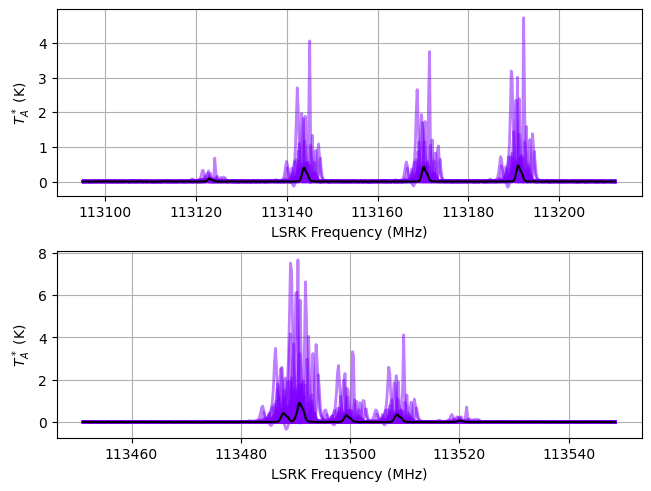

In [41]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=100,  # prior predictive samples
)
_ = plot_predictive(model.data, prior.prior_predictive)

In [42]:
start = time.time()
model.fit(
    n = 100_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.01, # VI relative convergence threshold
    abs_tolerance = 0.1, # VI absolute convergence threshold
    learning_rate = 1e-2, # VI learning rate
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 5900
Interrupted at 5,899 [5%]: Average Loss = 31,080


Output()

Runtime: 1.92 minutes


Sampling: [12CN-1, 12CN-2]


Output()

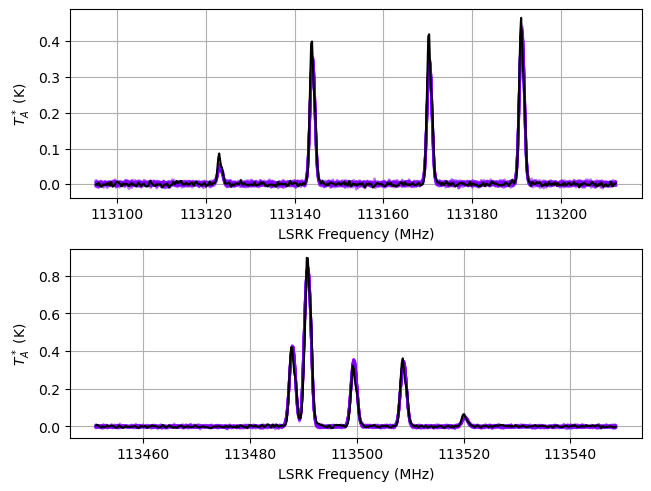

In [43]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [44]:
# ignore transition and state dependent parameters
var_names = [
    param for param in model.cloud_deterministics
    # if not set(model.model.named_vars_to_dims[param]).intersection(set(["transition", "transition_free", "state_l", "state_u"]))
]
pm.summary(model.trace.posterior, var_names=var_names + model.hyper_deterministics + model.baseline_freeRVs)

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
velocity[0],0.455,0.003,0.449,0.461,0.000,0.000,1074.0,981.0,NaN
log10_Tkin[0],0.659,0.001,0.658,0.661,0.000,0.000,996.0,941.0,NaN
fwhm_thermal[0],0.090,0.000,0.090,0.090,0.000,0.000,996.0,941.0,NaN
fwhm_nonthermal[0],3.182,0.007,3.169,3.194,0.000,0.000,1126.0,901.0,NaN
fwhm[0],3.183,0.007,3.171,3.195,0.000,0.000,1125.0,901.0,NaN
log10_N0[0],13.617,0.001,13.615,13.618,0.000,0.000,1050.0,1016.0,NaN
"Tex[113123.3687, 0]",4.563,0.006,4.552,4.577,0.000,0.000,996.0,941.0,NaN
"Tex[113144.19, 0]",4.563,0.006,4.552,4.577,0.000,0.000,996.0,941.0,NaN
"Tex[113170.535, 0]",4.563,0.006,4.552,4.577,0.000,0.000,996.0,941.0,NaN
"Tex[113191.325, 0]",4.563,0.006,4.552,4.577,0.000,0.000,996.0,941.0,NaN


In [45]:
start = time.time()
model.sample(
    init = "advi+adapt_diag", # initialization strategy
    tune = 1000, # tuning samples
    draws = 1000, # posterior samples
    chains = 8, # number of independent chains
    cores = 8, # number of parallel chains
    init_kwargs = {"rel_tolerance": 0.01, "abs_tolerance": 0.1, "learning_rate": 0.01}, # VI initialization arguments
    nuts_kwargs = {"target_accept": 0.9}, # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 5900
Interrupted at 5,899 [5%]: Average Loss = 31,080
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, log10_Tkin_norm, fwhm_nonthermal_norm, fwhm_L_norm, log10_N0_norm]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 128 seconds.


Adding log-likelihood to trace


Output()

Runtime: 4.58 minutes


In [48]:
model.solve(kl_div_threshold=0.1)

GMM converged to unique solution


Sampling: [12CN-1, 12CN-2]


Output()

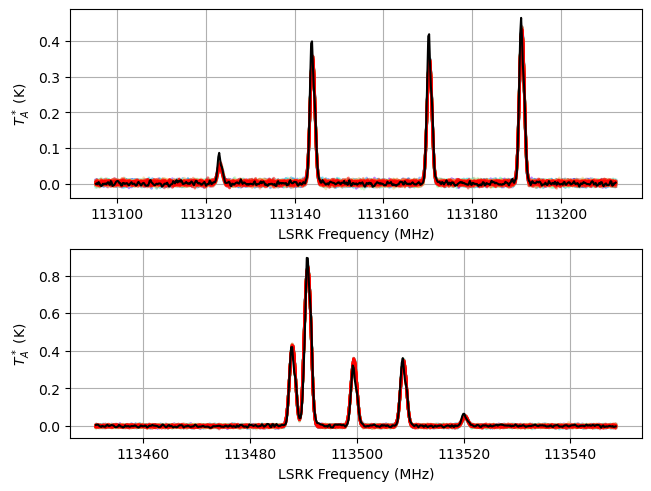

In [49]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [50]:
# ignore transition and state dependent parameters
var_names = [
    param for param in model.cloud_deterministics
    # if not set(model.model.named_vars_to_dims[param]).intersection(set(["transition", "transition_free", "state_l", "state_u"]))
]
pm.summary(model.trace.solution_0, var_names=var_names + model.hyper_deterministics + model.baseline_freeRVs)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
velocity[0],0.451,0.003,0.446,0.457,0.000,0.0,7760.0,5905.0,1.0
log10_Tkin[0],0.659,0.001,0.657,0.662,0.000,0.0,5284.0,4885.0,1.0
fwhm_thermal[0],0.090,0.000,0.089,0.090,0.000,0.0,5284.0,4885.0,1.0
fwhm_nonthermal[0],3.179,0.007,3.167,3.192,0.000,0.0,6518.0,5084.0,1.0
fwhm[0],3.181,0.007,3.168,3.193,0.000,0.0,6517.0,5067.0,1.0
log10_N0[0],13.618,0.004,13.610,13.626,0.000,0.0,5408.0,4920.0,1.0
"Tex[113123.3687, 0]",4.564,0.015,4.536,4.592,0.000,0.0,5284.0,4885.0,1.0
"Tex[113144.19, 0]",4.564,0.015,4.536,4.592,0.000,0.0,5284.0,4885.0,1.0
"Tex[113170.535, 0]",4.564,0.015,4.536,4.592,0.000,0.0,5284.0,4885.0,1.0
"Tex[113191.325, 0]",4.564,0.015,4.536,4.592,0.000,0.0,5284.0,4885.0,1.0


['velocity', 'log10_Tkin', 'fwhm_thermal', 'fwhm_nonthermal', 'fwhm', 'log10_N0', 'log10_N', 'tau_total']


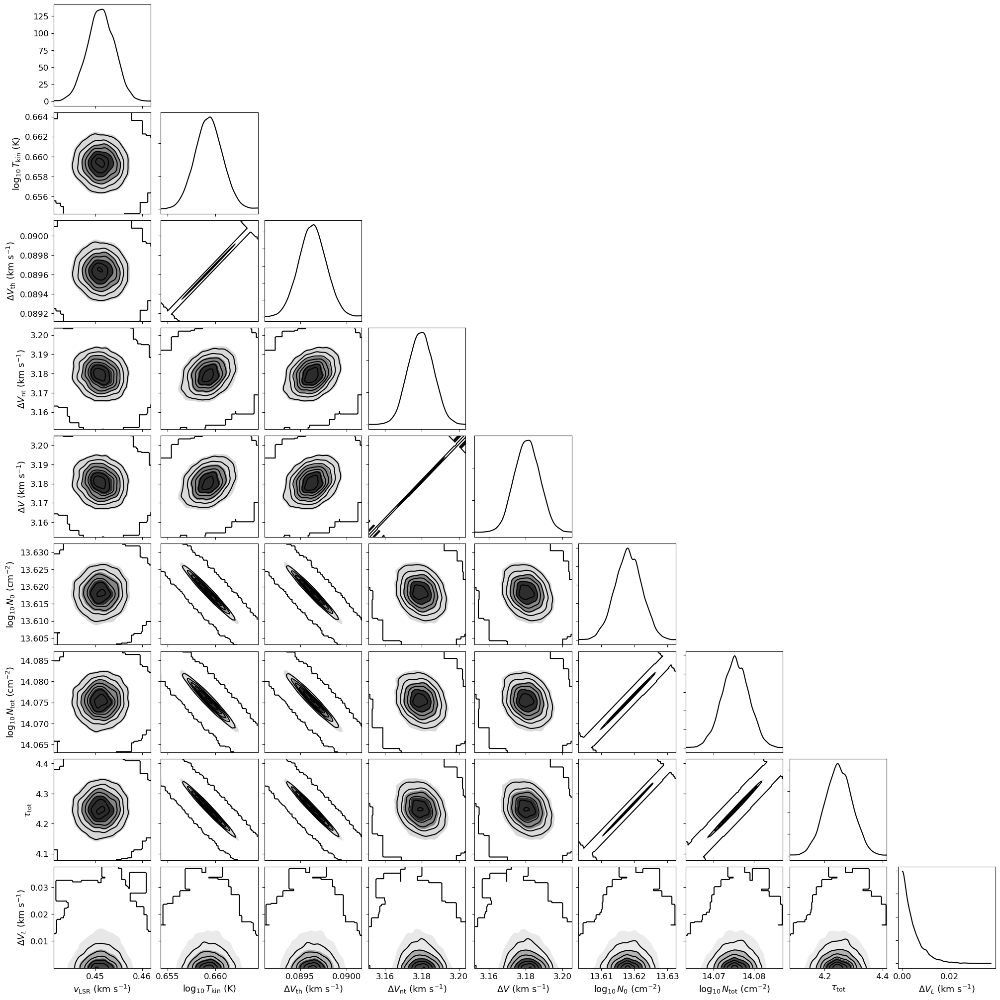

In [53]:
from bayes_spec.plots import plot_pair

# ignore transition and state dependent parameters
var_names = [
    param for param in model.cloud_deterministics
    if not set(model.model.named_vars_to_dims[param]).intersection(set(["transition", "transition_free", "state_l", "state_u"]))
]
print(var_names)
_ = plot_pair(
    model.trace.solution_0.sel(cloud=0), # samples
    var_names + model.hyper_deterministics, # var_names to plot
    labeller=model.labeller, # label manager
)

We find a higher column density and optical depth, but a similar excitation temperature.

## Non-LTE model
Fix the kinetic temperature

In [54]:
# Initialize and define the model
baseline_degree = 0
n_clouds = 1
model = CNModel(
    data_12CN,
    molecule="CN", # molecule (either "CN" or "13CN")
    mol_data=mol_data_12CN, # molecular data
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=0.78, # Main beam efficiency
    Feff=0.94, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N0 = [12.5, 0.5], # mean and width of log10 ground state column density prior (cm-2)
    prior_log10_Tkin = None, # ignored for this fixed kinetic temperature model
    prior_velocity = [0.0, 5.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = 1.0, # width of latent Lorentzian FWHM prior (km/s)
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = False, # do not assume LTE
    prior_log10_Tex = None, # ignored for non-CTEX model
    assume_CTEX = False, # do not assume CTEX
    prior_log10_inv_boltz_factor = 5.0, # width of Boltzmann factor prior distribution
    fix_log10_Tkin = 1.5, # fix kinetic temperature 
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

Transition 113144.19 is constraining upper state 1 from lower state 0
Transition 113191.325 is constraining upper state 2 from lower state 0
Transition 113490.985 is constraining upper state 4 from lower state 0
Transition 113508.934 is constraining upper state 0 from lower state 0
Transition 113520.4215 is constraining upper state 3 from lower state 0
Transition 113123.3687 is constraining lower state 1 from upper state 1
6/9 transitions used to constrain state densities
Free Tex transitions: [113123.3687 113144.19   113191.325  113490.985  113508.934  113520.4215]
Derived Tex transitions: [113170.535 113488.142 113499.643]


Sampling: [12CN-1, 12CN-2, baseline_12CN-1_norm, baseline_12CN-2_norm, fwhm_L_norm, fwhm_nonthermal_norm, log10_N0_norm, log10_inv_boltz_factor_free, velocity_norm]


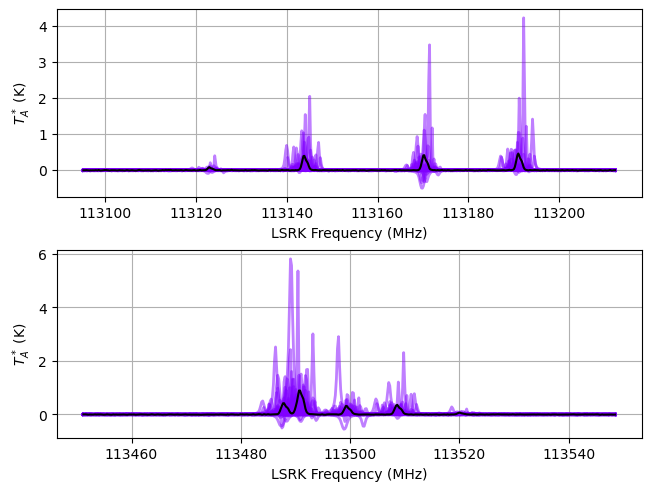

In [55]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=100,  # prior predictive samples
)
_ = plot_predictive(model.data, prior.prior_predictive)

In [56]:
start = time.time()
model.fit(
    n = 100_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.01, # VI relative convergence threshold
    abs_tolerance = 0.05, # VI absolute convergence threshold
    learning_rate = 0.01, # VI learning rate
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 7900
Interrupted at 7,899 [7%]: Average Loss = 23,035


Output()

Runtime: 1.48 minutes


Sampling: [12CN-1, 12CN-2]


Output()

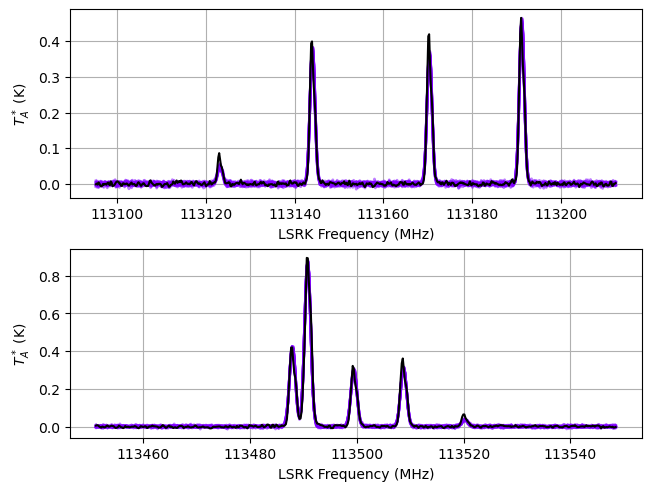

In [57]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [58]:
start = time.time()
model.sample(
    init = "advi+adapt_diag", # initialization strategy
    tune = 1000, # tuning samples
    draws = 1000, # posterior samples
    chains = 8, # number of independent chains
    cores = 8, # number of parallel chains
    init_kwargs = {"rel_tolerance": 0.01, "abs_tolerance": 0.05, "learning_rate": 0.01}, # VI initialization arguments
    nuts_kwargs = {"target_accept": 0.9}, # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 7900
Interrupted at 7,899 [7%]: Average Loss = 23,035
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, fwhm_L_norm, log10_N0_norm, log10_inv_boltz_factor_free]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 692 seconds.


Adding log-likelihood to trace


Output()

Runtime: 13.60 minutes


In [59]:
model.solve()

GMM converged to unique solution


Sampling: [12CN-1, 12CN-2]


Output()

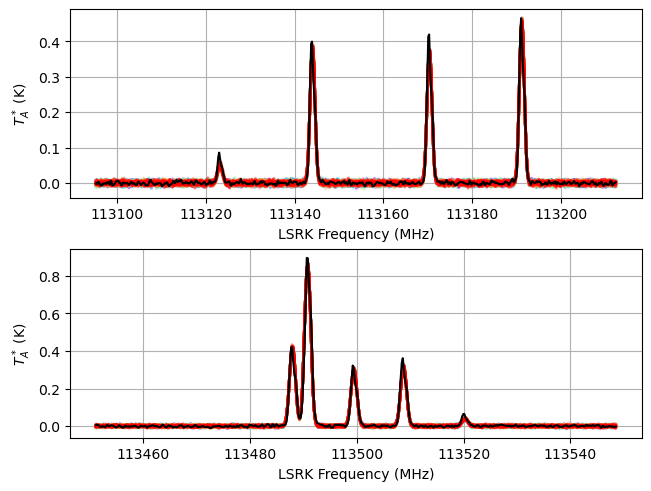

In [60]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [61]:
# ignore transition and state dependent parameters
var_names = [
    param for param in model.cloud_deterministics
    # if not set(model.model.named_vars_to_dims[param]).intersection(set(["transition", "transition_free", "state_l", "state_u"]))
]
pm.summary(model.trace.posterior, var_names=var_names + model.hyper_deterministics + model.baseline_freeRVs)

/opt/conda/envs/bayes_cn_hfs-dev/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
velocity[0],0.455,0.003,0.449,0.460,0.000,0.000,6437.0,5025.0,1.00
fwhm_thermal[0],0.236,0.000,0.236,0.236,0.000,0.000,8000.0,8000.0,NaN
fwhm_nonthermal[0],3.300,0.012,3.276,3.322,0.000,0.000,1345.0,2376.0,1.01
fwhm[0],3.308,0.012,3.285,3.330,0.000,0.000,1345.0,2376.0,1.01
log10_N0[0],13.406,0.021,13.368,13.447,0.001,0.000,1042.0,1548.0,1.01
"Tex[113123.3687, 0]",6.914,0.315,6.325,7.491,0.009,0.007,1178.0,1730.0,1.01
"Tex[113144.19, 0]",6.341,0.231,5.900,6.755,0.007,0.005,1070.0,1636.0,1.01
"Tex[113170.535, 0]",6.659,0.281,6.146,7.192,0.009,0.006,1132.0,1658.0,1.01
"Tex[113191.325, 0]",6.126,0.208,5.731,6.498,0.007,0.005,1031.0,1588.0,1.01
"Tex[113488.142, 0]",6.088,0.225,5.689,6.525,0.007,0.005,1104.0,1692.0,1.01


This model is both physically consistent and a better match to the data. There appears to be evidence for multiple cloud components.

## Number of clouds

In [6]:
from bayes_spec import Optimize
from bayes_cn_hfs import CNModel

max_n_clouds = 5
baseline_degree = 0
opt = Optimize(
    CNModel,
    data_12CN,
    molecule="CN", # molecule name
    mol_data=mol_data_12CN, # molecular data
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=0.78, # Main beam efficiency
    Feff=0.94, # Forward efficiency
    max_n_clouds=max_n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
opt.add_priors(
    prior_log10_N0 = [13.0, 0.25], # mean and width of log10 ground state column density prior (cm-2)
    prior_log10_Tkin = None, # ignored for this fixed kinetic temperature model
    prior_velocity = [0.0, 5.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = 1.0, # width of latent Lorentzian FWHM prior (km/s)
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = False, # do not assume LTE
    prior_log10_Tex = None, # ignored for non-CTEX model
    assume_CTEX = False, # do not assume CTEX
    prior_log10_inv_boltz_factor = 5.0, # width of Boltzmann factor prior distribution
    allow_masers = False, # do not allow negative excitation temperatures
    fix_log10_Tkin = 1.5, # fix kinetic temperature
    ordered = False, # do not assume optically-thin
)
opt.add_likelihood()

Transition 113144.19 is constraining upper state 4 from lower state 0
Transition 113191.325 is constraining upper state 3 from lower state 0
Transition 113490.985 is constraining upper state 0 from lower state 0
Transition 113508.934 is constraining upper state 2 from lower state 0
Transition 113520.4215 is constraining upper state 1 from lower state 0
Transition 113123.3687 is constraining lower state 1 from upper state 4
6/9 transitions used to constrain state densities
Free Tex transitions: [113123.3687 113144.19   113191.325  113490.985  113508.934  113520.4215]
Derived Tex transitions: [113170.535 113488.142 113499.643]
Transition 113144.19 is constraining upper state 4 from lower state 0
Transition 113191.325 is constraining upper state 3 from lower state 0
Transition 113490.985 is constraining upper state 0 from lower state 0
Transition 113508.934 is constraining upper state 2 from lower state 0
Transition 113520.4215 is constraining upper state 1 from lower state 0
Transition 1

/opt/conda/envs/bayes_cn_hfs-dev/lib/python3.12/site-packages/bayes_spec/base_model.py:371: UserWarning: The effect of Potentials on other parameters is ignored during prior predictive sampling. This is likely to lead to invalid or biased predictive samples.
  trace = pm.sample_prior_predictive(samples=samples, random_seed=self.seed)
Sampling: [12CN-1, 12CN-2, baseline_12CN-1_norm, baseline_12CN-2_norm, fwhm_L_norm, fwhm_nonthermal_norm, log10_N0_norm, log10_inv_boltz_factor_free, velocity_norm]


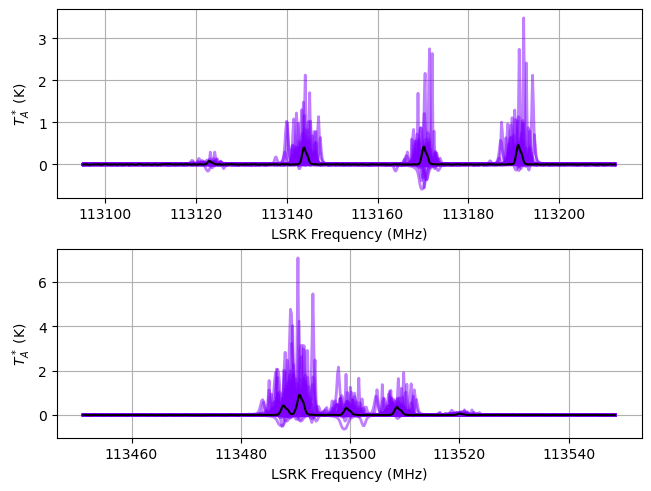

In [7]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = opt.models[1].sample_prior_predictive(
    samples=100,  # prior predictive samples
)
_ = plot_predictive(opt.models[1].data, prior.prior_predictive)

In [8]:
start = time.time()
fit_kwargs = {
    "n": 100_000,
    "rel_tolerance": 0.01,
    "abs_tolerance": 0.05,
    "learning_rate": 0.01,
}
opt.fit_all(**fit_kwargs)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Null hypothesis BIC = 4.940e+05
Approximating n_cloud = 1 posterior...


Output()

Convergence achieved at 6000
Interrupted at 5,999 [5%]: Average Loss = 19,562


Output()

n_cloud = 1 BIC = -6.223e+02

Approximating n_cloud = 2 posterior...


Output()

Convergence achieved at 5300
Interrupted at 5,299 [5%]: Average Loss = 15,104


Output()

n_cloud = 2 BIC = -6.503e+03

Approximating n_cloud = 3 posterior...


Output()

Convergence achieved at 12500
Interrupted at 12,499 [12%]: Average Loss = 3,194.2


Output()

n_cloud = 3 BIC = -8.246e+03

Approximating n_cloud = 4 posterior...


Output()

Convergence achieved at 19300
Interrupted at 19,299 [19%]: Average Loss = 4,748.8


Output()

n_cloud = 4 BIC = -8.687e+03

Approximating n_cloud = 5 posterior...


Output()

Convergence achieved at 35100
Interrupted at 35,099 [35%]: Average Loss = -1,956


Output()

n_cloud = 5 BIC = -8.439e+03

Runtime: 11.97 minutes


[493955.05587382   -622.31677251  -6503.09968702  -8245.53532806
  -8686.62185795  -8438.55925075]


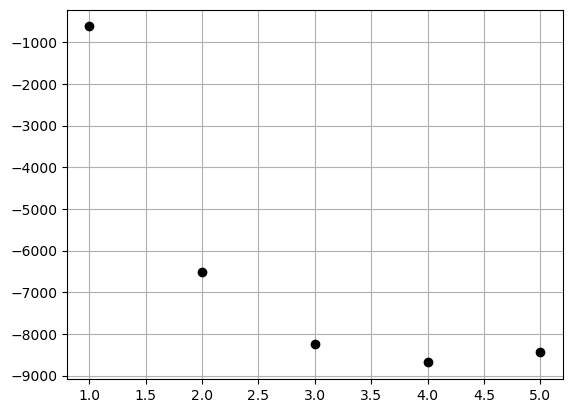

In [9]:
null_bic = opt.models[1].null_bic()
n_clouds = np.arange(max_n_clouds+1)
bics_vi = np.array([null_bic] + [model.bic(chain=0) for model in opt.models.values()])
print(bics_vi)

plt.plot(n_clouds[1:], bics_vi[1:], 'ko')

In [10]:
start = time.time()
fit_kwargs = {
    "rel_tolerance": 0.01,
    "abs_tolerance": 0.05,
    "learning_rate": 0.01,
}
sample_kwargs = {
    "chains": 8,
    "cores": 8,
    "n_init": 100_000,
    "init_kwargs": fit_kwargs,
    "nuts_kwargs": {"target_accept": 0.8},
}
opt.optimize(fit_kwargs=fit_kwargs, sample_kwargs=sample_kwargs, approx=False)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Null hypothesis BIC = 4.940e+05
Sampling n_cloud = 1 posterior...
Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 6000
Interrupted at 5,999 [5%]: Average Loss = 19,562
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, fwhm_L_norm, log10_N0_norm, log10_inv_boltz_factor_free]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 341 seconds.


Adding log-likelihood to trace


Output()

GMM converged to unique solution
n_cloud = 1 solution = 0 BIC = -7.938e+02

Sampling n_cloud = 2 posterior...
Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 5300
Interrupted at 5,299 [5%]: Average Loss = 15,104
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, fwhm_L_norm, log10_N0_norm, log10_inv_boltz_factor_free]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 1011 seconds.


Adding log-likelihood to trace


Output()

GMM converged to unique solution
n_cloud = 2 solution = 0 BIC = -7.204e+03

Sampling n_cloud = 3 posterior...
Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 12500
Interrupted at 12,499 [12%]: Average Loss = 3,194.2
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, fwhm_L_norm, log10_N0_norm, log10_inv_boltz_factor_free]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 1753 seconds.


Adding log-likelihood to trace


Output()

GMM converged to unique solution
n_cloud = 3 solution = 0 BIC = -8.690e+03

Sampling n_cloud = 4 posterior...
Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 19300
Interrupted at 19,299 [19%]: Average Loss = 4,748.8
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, fwhm_L_norm, log10_N0_norm, log10_inv_boltz_factor_free]


Output()

ParallelSamplingError: Chain 0 failed with: Bad initial energy: SamplerWarning(kind=<WarningType.BAD_ENERGY: 8>, message='Bad initial energy, check any log probabilities that are inf or -inf, nan or very small:\n[]\n.Try model.debug() to identify parametrization problems.', level='critical', step=0, exec_info=None, extra=None, divergence_point_source=None, divergence_point_dest=None, divergence_info=None)

In [ ]:
null_bic = opt.models[1].null_bic()
n_clouds = np.arange(max_n_clouds+1)
bics_mcmc = np.array([null_bic] + [model.bic(solution=0) for model in opt.models.values()])
print(bics_mcmc)

plt.plot(n_clouds[1:], bics_vi[1:], 'ko', label="VI")
plt.plot(n_clouds[1:], bics_mcmc[1:], 'ro', label="MCMC")
plt.xlabel("Number of Clouds")
plt.ylabel("BIC")
_ = plt.legend()

[    0.          -853.91150953 -7309.13967568 -8840.53872613
 -8990.59902849 -9053.89874286]


/tmp/ipykernel_1139/1502562097.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  _ = plt.legend()


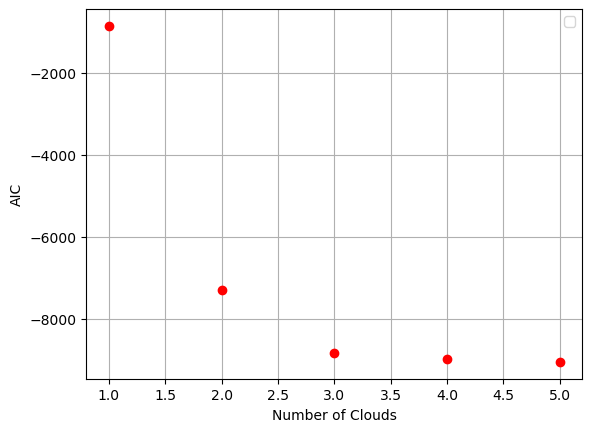

In [71]:
aics_mcmc = np.array([0.0] + [2.0*model._n_params - 2.0*model.mean_lnlike(solution=0) for model in opt.models.values()])
print(aics_mcmc)

plt.plot(n_clouds[1:], aics_mcmc[1:], 'ro')
plt.xlabel("Number of Clouds")
plt.ylabel("AIC")
_ = plt.legend()

In [81]:
model = opt.models[3]
print(model.n_clouds)
model.solve()

# ignore transition and state dependent parameters
var_names = [
    param for param in model.cloud_deterministics
    # if not set(model.model.named_vars_to_dims[param]).intersection(set(["transition", "transition_free", "state_l", "state_u"]))
]
pm.summary(model.trace.solution_0, var_names=var_names + model.hyper_deterministics + model.baseline_freeRVs)

3
GMM converged to unique solution


/opt/conda/envs/bayes_cn_hfs-dev/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
velocity[0],-0.774,0.030,-0.831,-0.717,0.000,0.000,3960.0,4713.0,1.0
velocity[1],0.803,0.022,0.760,0.845,0.000,0.000,2689.0,3929.0,1.0
velocity[2],1.354,0.028,1.303,1.409,0.000,0.000,3470.0,4200.0,1.0
fwhm_thermal[0],0.236,0.000,0.236,0.236,0.000,0.000,8000.0,8000.0,NaN
fwhm_thermal[1],0.236,0.000,0.236,0.236,0.000,0.000,8000.0,8000.0,NaN
fwhm_thermal[2],0.236,0.000,0.236,0.236,0.000,0.000,8000.0,8000.0,NaN
fwhm_nonthermal[0],2.043,0.046,1.963,2.133,0.001,0.001,4095.0,4170.0,1.0
fwhm_nonthermal[1],1.285,0.061,1.173,1.401,0.001,0.001,1989.0,3237.0,1.0
fwhm_nonthermal[2],1.704,0.036,1.638,1.772,0.001,0.000,3173.0,4361.0,1.0
fwhm[0],2.057,0.045,1.977,2.146,0.001,0.001,4095.0,4170.0,1.0


Sampling: [12CN-1, 12CN-2]


Output()

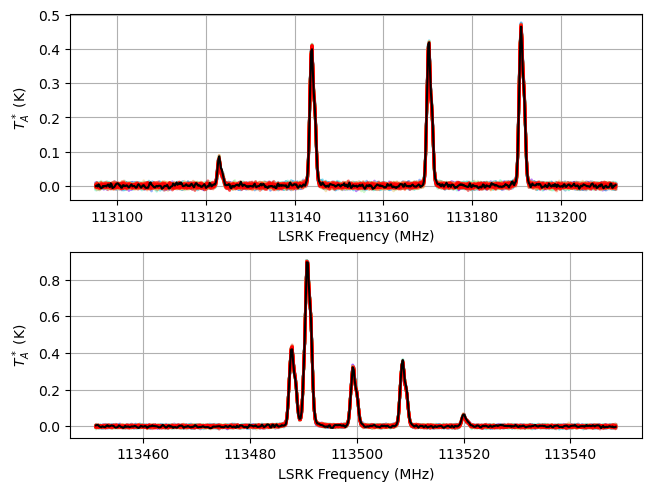

In [73]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

['velocity_norm', 'fwhm_nonthermal_norm', 'log10_N0_norm', 'log10_inv_boltz_factor_free']


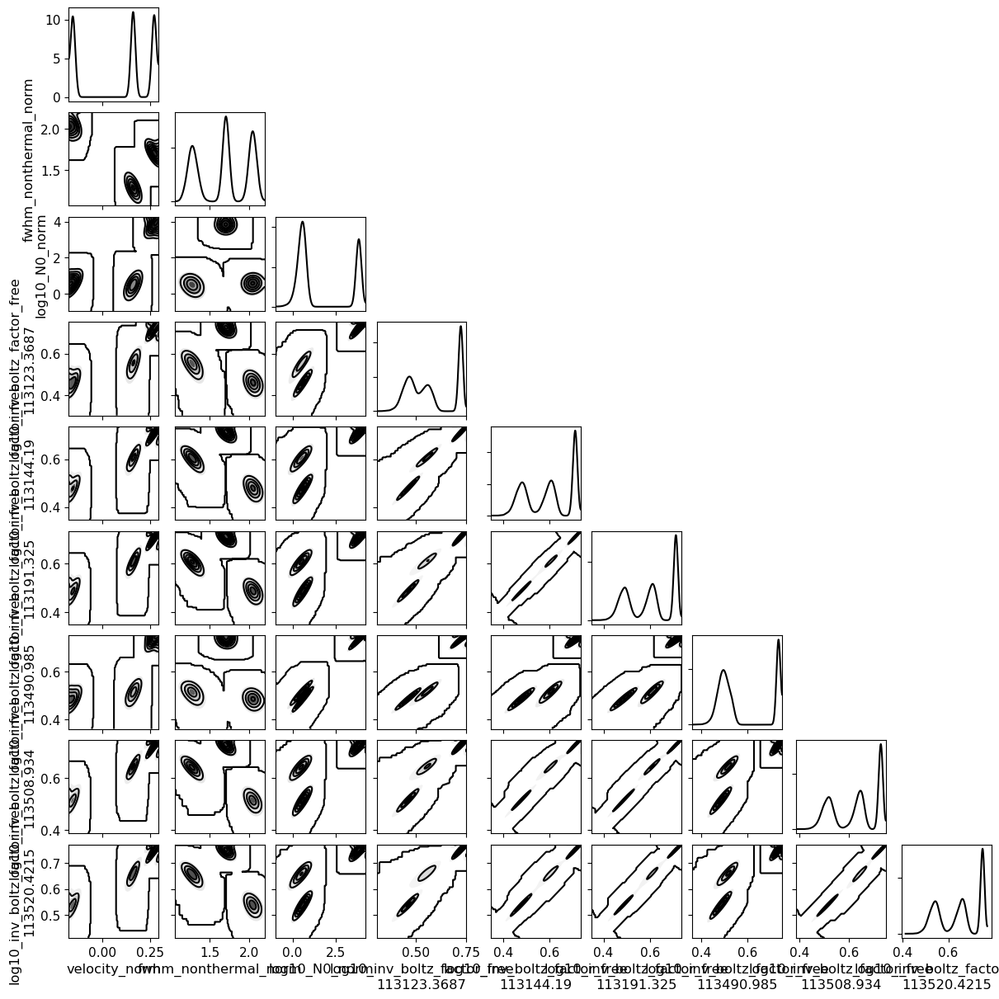

In [85]:
from bayes_spec.plots import plot_pair

var_names = [
    param for param in model.cloud_freeRVs
    # if not set(model.model.named_vars_to_dims[param]).intersection(set(["transition_free"]))
]
print(var_names)
axes = plot_pair(
    model.trace.solution_0, # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
)
_ = axes.ravel()[0].figure.set_size_inches(12, 12)

['velocity', 'fwhm_nonthermal', 'fwhm', 'log10_N0', 'log10_N', 'tau_total']


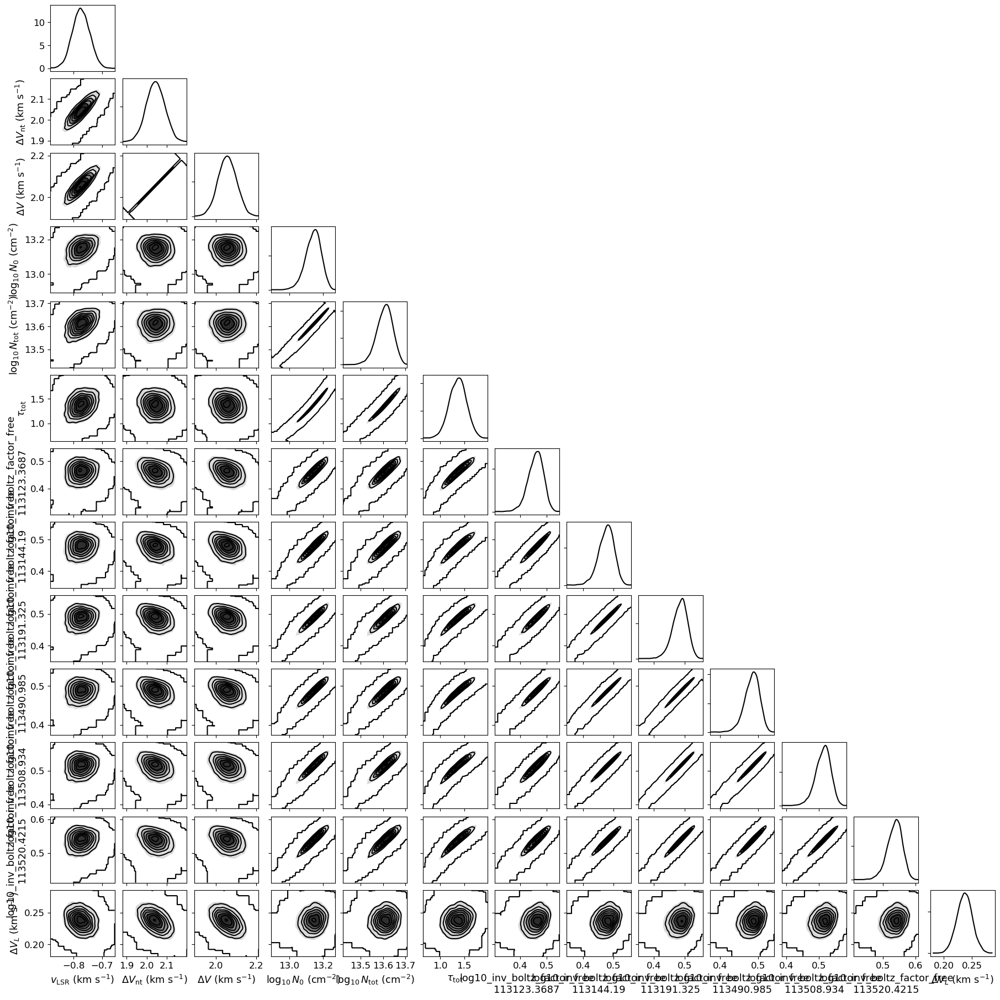

In [86]:
# ignore transition and state dependent parameters
var_names = [
    param for param in model.cloud_deterministics
    if not set(model.model.named_vars_to_dims[param]).intersection(set(["transition", "transition_free", "state_l", "state_u"]))
    and param not in ["fwhm_thermal"]
]
print(var_names)
_ = plot_pair(
    model.trace.solution_0.sel(cloud=0), # samples
    var_names + ["log10_inv_boltz_factor_free"] + model.hyper_deterministics, # var_names to plot
    labeller=model.labeller, # label manager
)

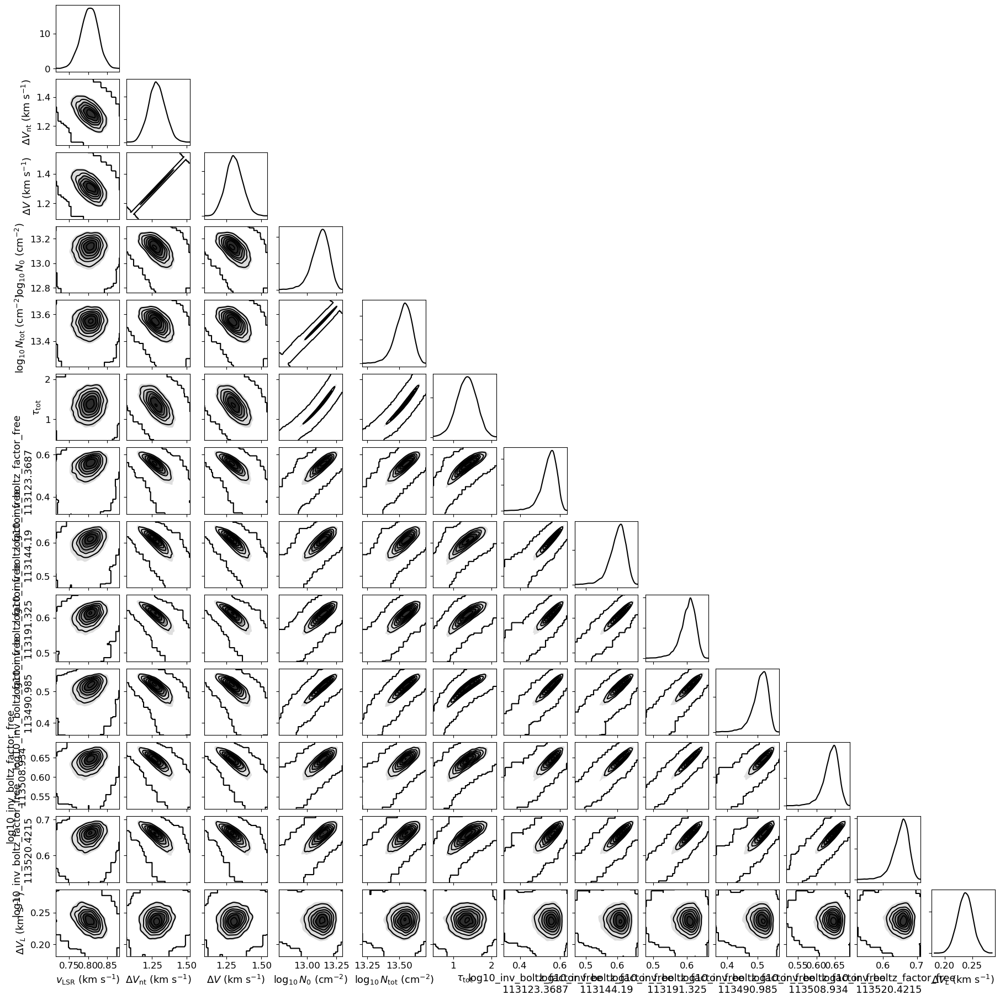

In [87]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=1), # samples
    var_names + ["log10_inv_boltz_factor_free"] + model.hyper_deterministics, # var_names to plot
    labeller=model.labeller, # label manager
)

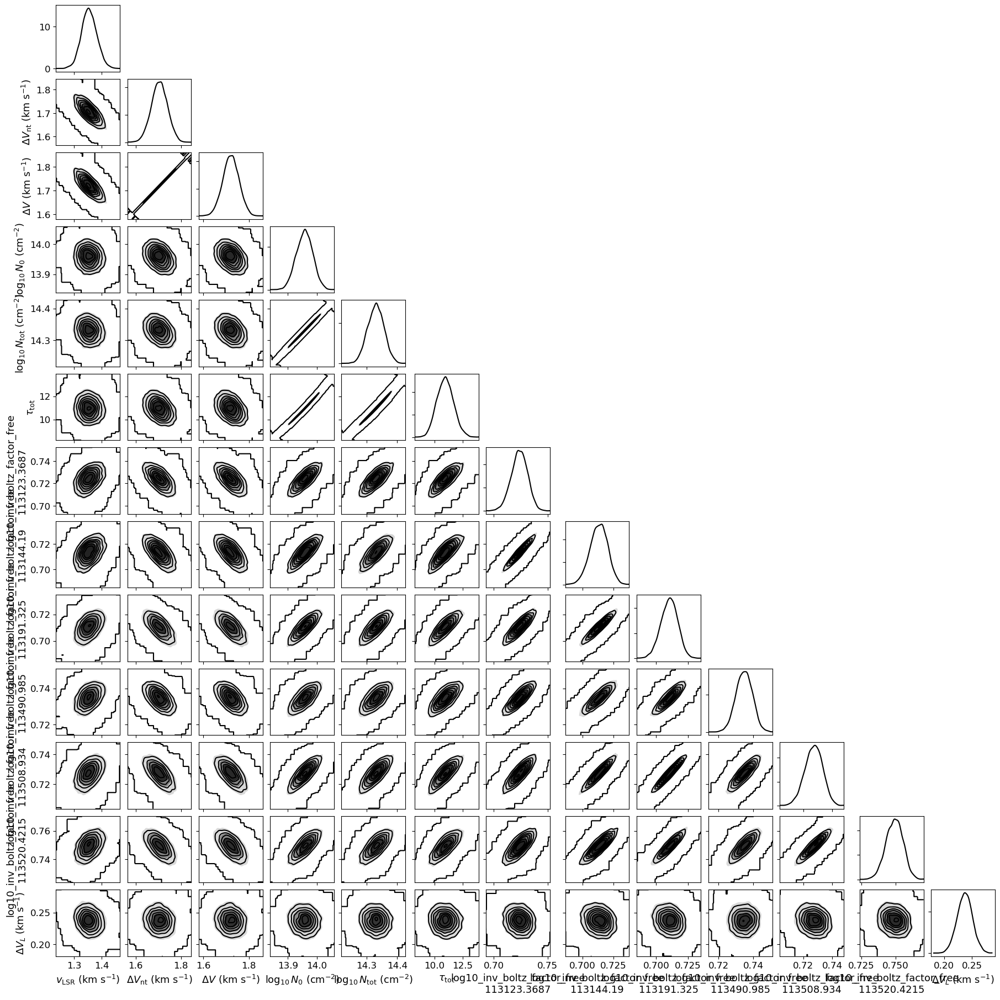

In [88]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=2), # samples
    var_names + ["log10_inv_boltz_factor_free"] + model.hyper_deterministics, # var_names to plot
    labeller=model.labeller, # label manager
)

## Ratio Model

In [3]:
from bayes_cn_hfs.cn_ratio_model import CNRatioModel

# Initialize and define the model
n_clouds = 3 # number of cloud components
baseline_degree = 0 # polynomial baseline degree
model = CNRatioModel(
    data,
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=0.78, # Main beam efficiency
    Feff=0.94, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N0_12CN = [13.0, 0.25], # mean and width of log10 12CN ground state column density prior (cm-2)
    prior_log10_N0_13CN = [11.0, 0.25], # mean and width of log10 13CN ground state column density prior (cm-2)
    prior_log10_Tkin = None, # ignored for this fixed kinetic temperature model
    prior_velocity = [0.0, 5.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = 1.0, # width of latent Lorentzian FWHM prior (km/s) TIP: set to typical feature separation
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = False, # do not assume LTE
    prior_log10_Tex = [1.0, 0.5], # mean and width of 13CN CTEX
    assume_CTEX_12CN = False, # do not assume 12CN CTEX
    assume_CTEX_13CN = True, # assume 13CN CTEX
    prior_log10_inv_boltz_factor = 5.0, # width of 12CN Boltzmann factor prior distribution
    fix_log10_Tkin = 1.5, # fix kinetic temperature 
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

Transition 113144.19 is constraining upper state 1 from lower state 0
Transition 113191.325 is constraining upper state 0 from lower state 0
Transition 113490.985 is constraining upper state 4 from lower state 0
Transition 113508.934 is constraining upper state 3 from lower state 0
Transition 113520.4215 is constraining upper state 2 from lower state 0
Transition 113123.3687 is constraining lower state 1 from upper state 1
6/9 transitions used to constrain state densities
Free Tex transitions: [113123.3687 113144.19   113191.325  113490.985  113508.934  113520.4215]
Derived Tex transitions: [113170.535 113488.142 113499.643]
Transition 108631.121 is constraining upper state 5 from lower state 2
Transition 108636.923 is constraining upper state 6 from lower state 2
Transition 108651.297 is constraining upper state 9 from lower state 2
Transition 108986.8678 is constraining upper state 8 from lower state 2
Transition 109217.6017 is constraining upper state 3 from lower state 2
Transition

Sampling: [12CN-1, 12CN-2, 13CN, baseline_12CN-1_norm, baseline_12CN-2_norm, baseline_13CN_norm, fwhm_L_norm, fwhm_nonthermal_norm, log10_N0_12CN_norm, log10_N0_13CN_norm, log10_Tex_13CN_norm, log10_inv_boltz_factor_free_12CN, velocity_norm]


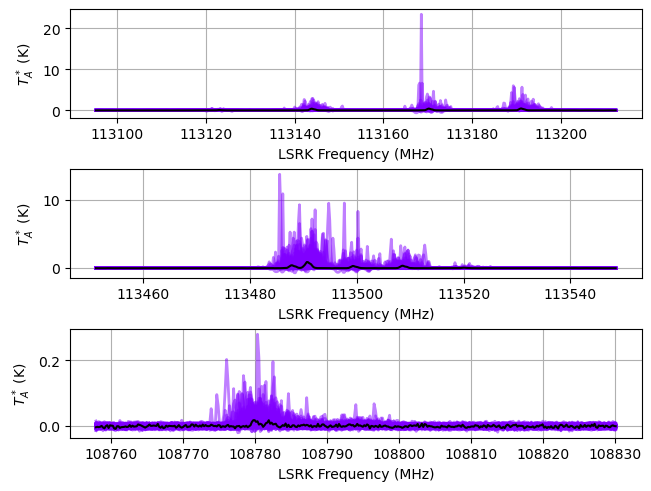

In [4]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=100,  # prior predictive samples
)
_ = plot_predictive(model.data, prior.prior_predictive)

In [5]:
start = time.time()
model.fit(
    n = 100_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.01, # VI relative convergence threshold
    abs_tolerance = 0.05, # VI absolute convergence threshold
    learning_rate = 0.01, # VI learning rate
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 15200
Interrupted at 15,199 [15%]: Average Loss = 4,840.1


Output()

Runtime: 6.51 minutes


Sampling: [12CN-1, 12CN-2, 13CN]


Output()

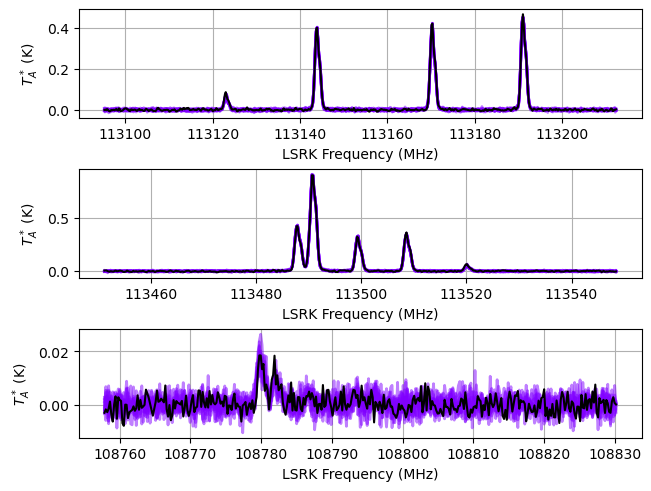

In [6]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [7]:
start = time.time()
model.sample(
    init = "advi+adapt_diag", # initialization strategy
    tune = 1000, # tuning samples
    draws = 1000, # posterior samples
    chains = 8, # number of independent chains
    cores = 8, # number of parallel chains
    init_kwargs = {"rel_tolerance": 0.01, "abs_tolerance": 0.05, "learning_rate": 0.01}, # VI initialization arguments
    nuts_kwargs = {"target_accept": 0.9}, # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 15200
Interrupted at 15,199 [15%]: Average Loss = 4,840.1
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, baseline_13CN_norm, velocity_norm, fwhm_nonthermal_norm, fwhm_L_norm, log10_N0_12CN_norm, log10_N0_13CN_norm, log10_inv_boltz_factor_free_12CN, log10_Tex_13CN_norm]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 7928 seconds.


Adding log-likelihood to trace


Output()

Runtime: 136.93 minutes


In [8]:
model.solve(kl_div_threshold=0.1)

GMM converged to unique solution


In [9]:
print("solutions:", model.solutions)

# ignore transition and state dependent parameters
pm.summary(model.trace.posterior, var_names=model.cloud_deterministics + model.hyper_deterministics + model.baseline_freeRVs)

solutions: [0]


/opt/conda/envs/bayes_cn_hfs-dev/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
velocity[0],0.635,0.011,0.615,0.655,0.000,0.000,5098.0,5744.0,1.00
velocity[1],1.409,0.024,1.367,1.456,0.000,0.000,3995.0,4743.0,1.00
velocity[2],-0.846,0.025,-0.896,-0.801,0.000,0.000,3697.0,5168.0,1.00
fwhm_thermal_12CN[0],0.236,0.000,0.236,0.236,0.000,0.000,8000.0,8000.0,NaN
fwhm_thermal_12CN[1],0.236,0.000,0.236,0.236,0.000,0.000,8000.0,8000.0,NaN
fwhm_thermal_12CN[2],0.236,0.000,0.236,0.236,0.000,0.000,8000.0,8000.0,NaN
fwhm_thermal_13CN[0],0.232,0.000,0.232,0.232,0.000,0.000,8000.0,8000.0,NaN
fwhm_thermal_13CN[1],0.232,0.000,0.232,0.232,0.000,0.000,8000.0,8000.0,NaN
fwhm_thermal_13CN[2],0.232,0.000,0.232,0.232,0.000,0.000,8000.0,8000.0,NaN
fwhm_nonthermal[0],1.541,0.050,1.443,1.632,0.001,0.001,2034.0,2879.0,1.00


Sampling: [12CN-1, 12CN-2, 13CN]


Output()

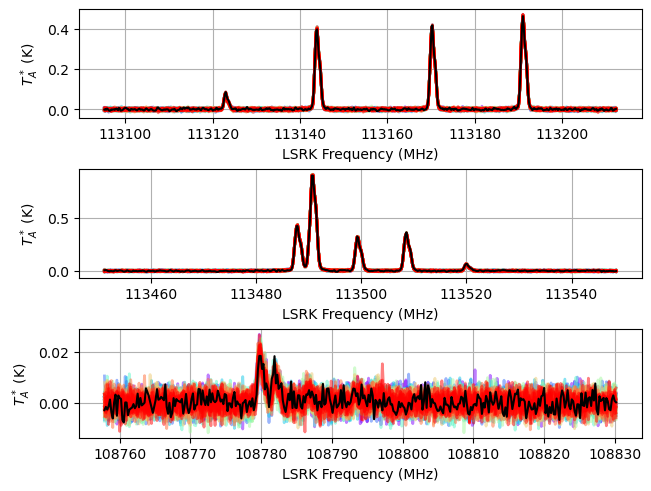

In [10]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

['velocity_norm', 'fwhm_nonthermal_norm', 'log10_N0_12CN_norm', 'log10_N0_13CN_norm', 'log10_inv_boltz_factor_free_12CN', 'log10_Tex_13CN_norm']


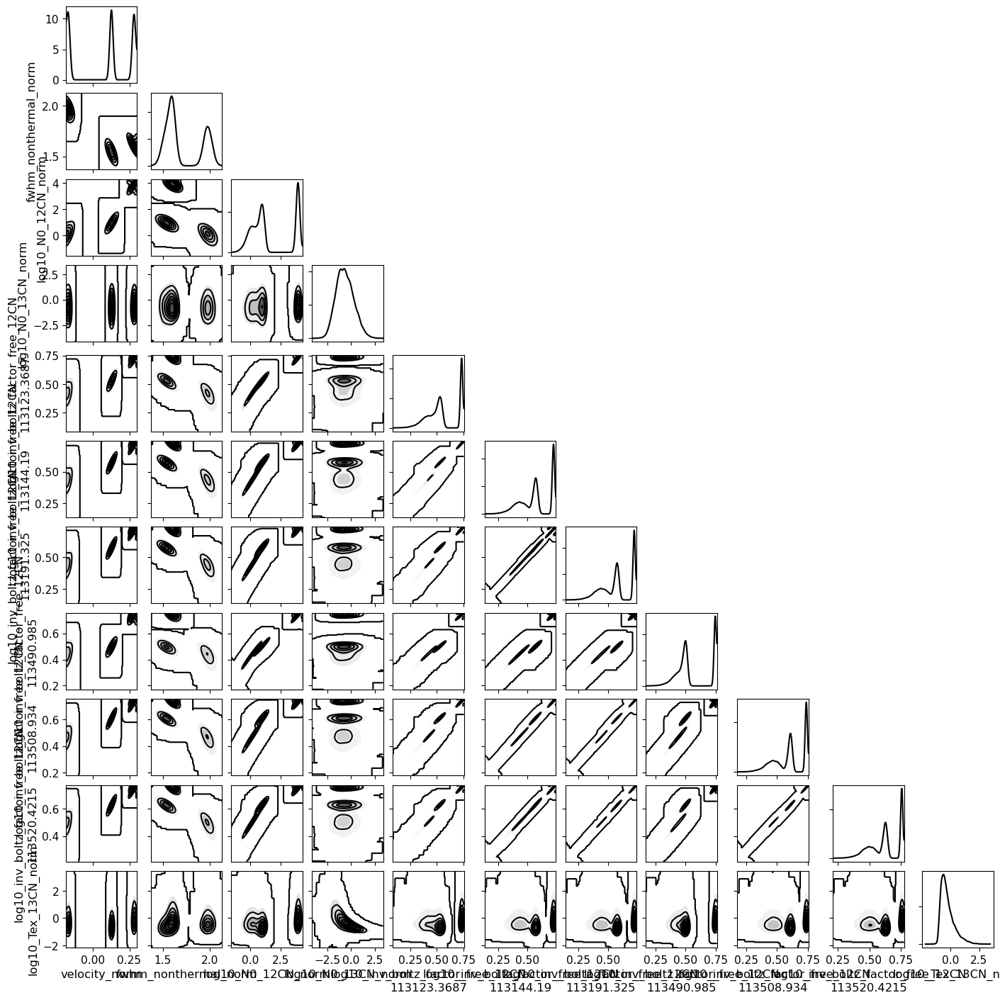

In [13]:
from bayes_spec.plots import plot_pair

var_names = [
    param for param in model.cloud_freeRVs
    if not set(model.model.named_vars_to_dims[param]).intersection(set([
        #"transition_12CN", "transition_free_12CN", "transition_13CN", "transition_free_13CN",
        "state_l_12CN", "state_l_13CN"
    ]))
]
print(var_names)
_ = plot_pair(
    model.trace.solution_0, # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
)

In [12]:
import pickle
with open("/staging/twenger2/g211_trace.pkl", "wb") as f:
    pickle.dump(model.trace, f)

Note the degeneracy between the excitation temperature and 13CN column density.

['velocity', 'fwhm_nonthermal', 'fwhm_12CN', 'fwhm_13CN', 'log10_N0_12CN', 'log10_N0_13CN', 'log10_N_12CN', 'tau_total_12CN', 'log10_Tex', 'log10_N_13CN', 'tau_total_13CN', '12C_13C_ratio']


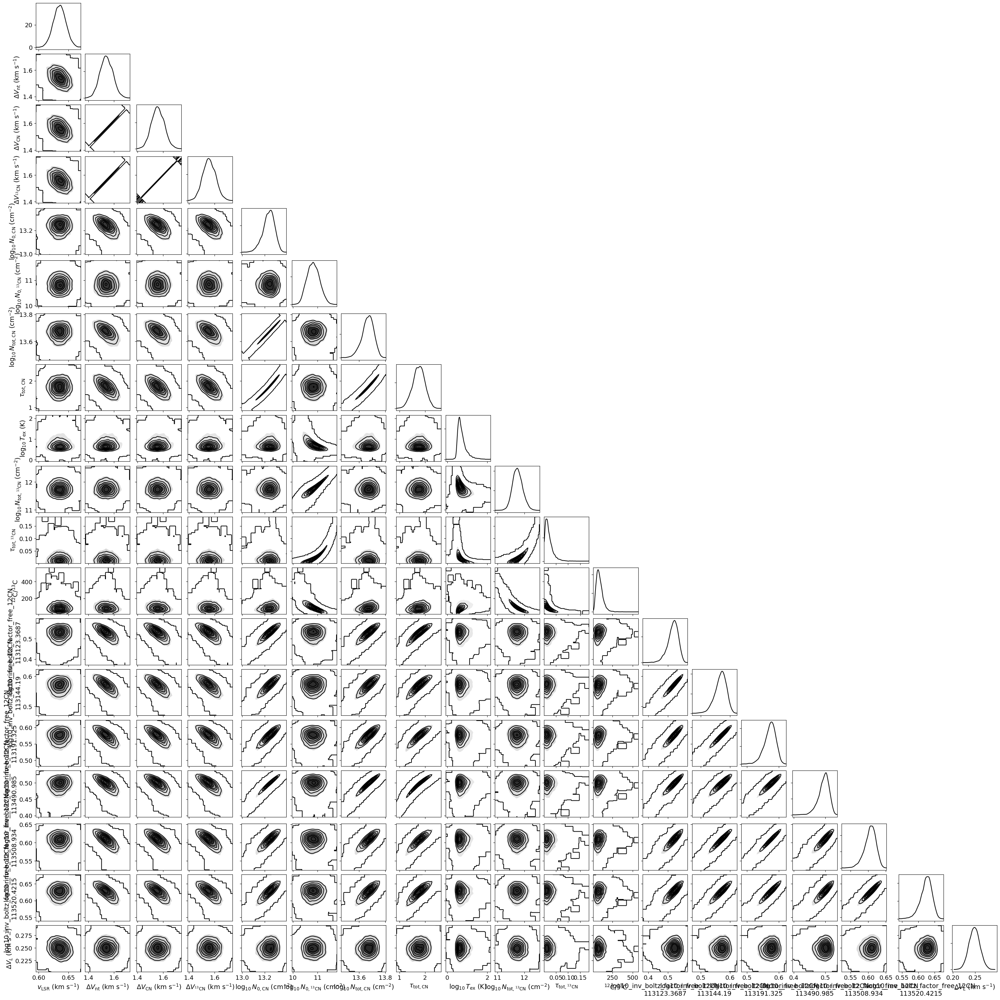

In [16]:
# ignore transition and state dependent parameters
var_names = [
    param for param in model.cloud_deterministics
    if not set(model.model.named_vars_to_dims[param]).intersection(set([
        "transition_12CN", "transition_13CN", "transition_free_12CN",
        "state_l_12CN", "state_u_12CN", "state_l_13CN", "state_u_13CN"
    ]))
    and param not in ["fwhm_thermal_12CN", "fwhm_thermal_13CN"]
]
print(var_names)
_ = plot_pair(
    model.trace.solution_0.sel(cloud=0), # samples
    var_names + ["log10_inv_boltz_factor_free_12CN"] + model.hyper_deterministics, # var_names to plot
    labeller=model.labeller, # label manager
)

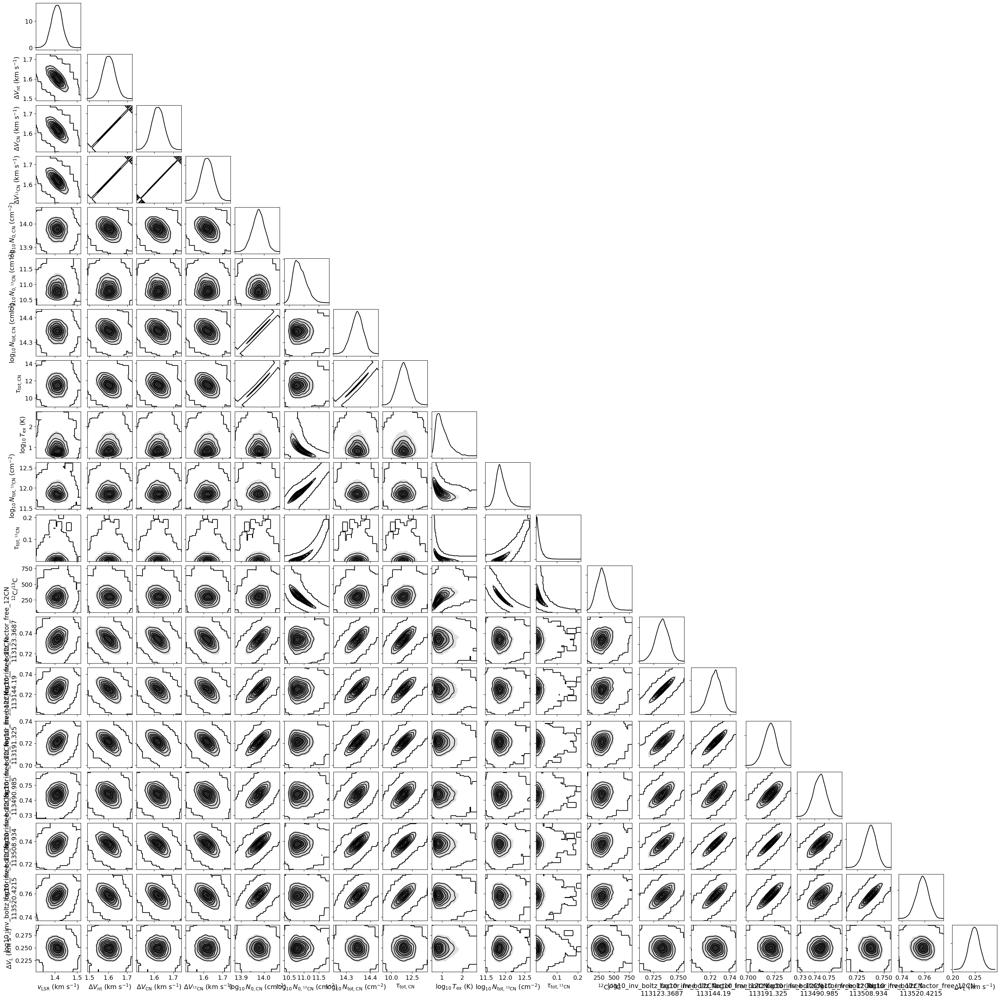

In [17]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=1), # samples
    var_names + ["log10_inv_boltz_factor_free_12CN"] + model.hyper_deterministics, # var_names to plot
    labeller=model.labeller, # label manager
)

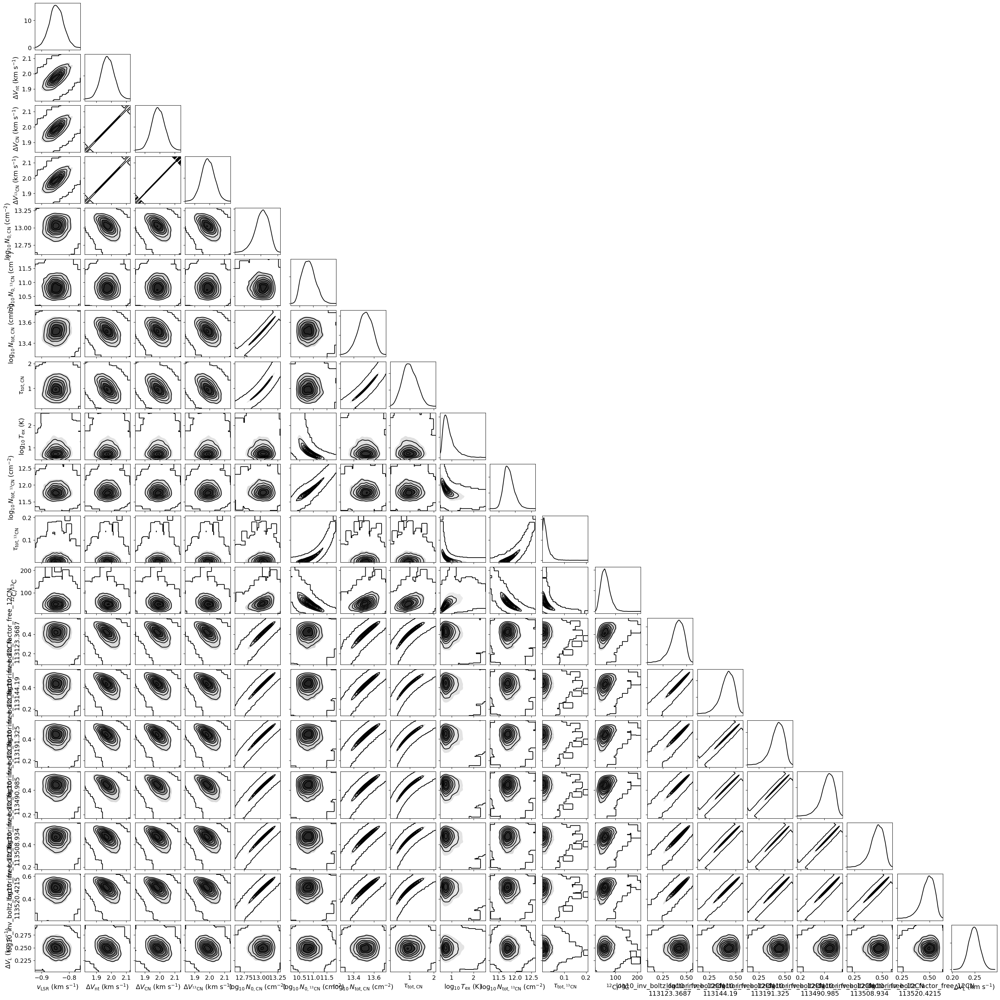

In [18]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=2), # samples
    var_names + ["log10_inv_boltz_factor_free_12CN"] + model.hyper_deterministics, # var_names to plot
    labeller=model.labeller, # label manager
)

These posterior distributions represent our knowledge about the physical conditions with only the assumption of CTEX for 13CN. The large uncertainties on the isotopic ratios reflect our lack of knowledge about the 13CN exitation temperature. We can sum over clouds and marginalize over the other parameters to quantify our inference about the isotopic ratio.

12C/13C <xarray.DataArray ()> Size: 8B
array(149.13456538) <xarray.DataArray ()> Size: 8B
array(32.37545325)


Text(0, 0.5, 'Probability Density')

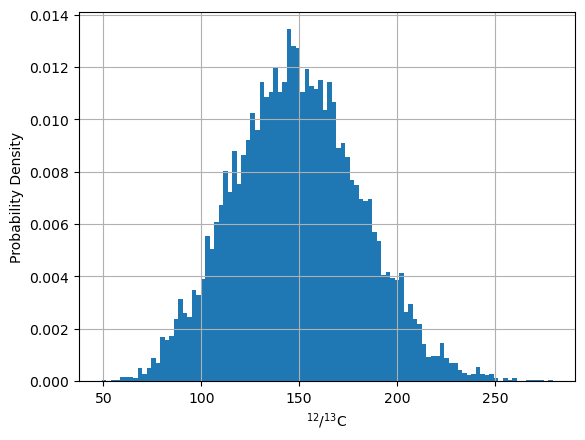

In [21]:
N_12CN_tot = (10.0**model.trace.solution_0["log10_N_12CN"]).sum(dim="cloud")
N_13CN_tot = (10.0**model.trace.solution_0["log10_N_13CN"]).sum(dim="cloud")
ratio_12C_13C = N_12CN_tot/N_13CN_tot

print("12C/13C", ratio_12C_13C.mean(), ratio_12C_13C.std())

plt.hist(ratio_12C_13C.data.flatten(), bins=100, density=True)
plt.xlabel(r"$^{12}$/$^{13}$C")
plt.ylabel("Probability Density")

## Assumption about 13CN Excitation Temperature
We can further assume that the excitation conditions of 13CN are similar to 12CN. We could either condition the posteiror distribution of the previous model on this assumption, or we can factor it in to our model via a prior distribution. Here we specify the prior based on the 12CN excitation temperature distribution.

In [26]:
# Column density weighted mean excitation temperature
N_12CN_weights = 10.0**model.trace.solution_0["log10_N_12CN"]
Tex_12CN = model.trace.solution_0["Tex_12CN"]
mean_Tex_12CN = (N_12CN_weights * Tex_12CN).sum(dim="cloud")/N_12CN_weights.sum(dim="cloud")

log10 Tex 12CN <xarray.DataArray ()> Size: 8B
array(0.55584685) <xarray.DataArray ()> Size: 8B
array(0.01529087)


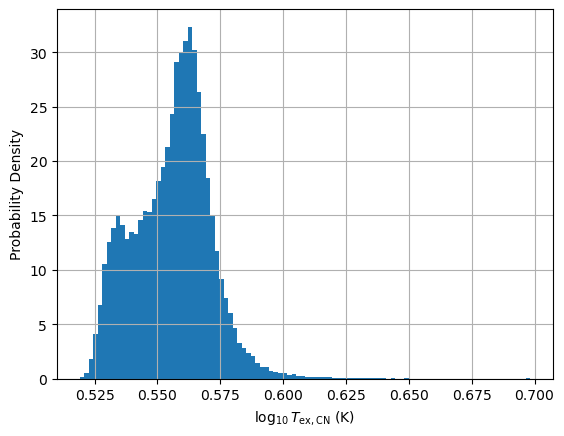

In [27]:
plt.hist(np.log10(mean_Tex_12CN.data).flatten(), bins=100, density=True)
plt.xlabel(r"$\log_{10} T_{\rm ex, CN}$ (K)")
plt.ylabel("Probability Density")

print("log10 Tex 12CN", np.log10(mean_Tex_12CN).mean(), np.log10(mean_Tex_12CN).std())

In [28]:
from bayes_cn_hfs.cn_ratio_model import CNRatioModel

# Initialize and define the model
n_clouds = 3 # number of cloud components
baseline_degree = 0 # polynomial baseline degree
model = CNRatioModel(
    data,
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=0.78, # Main beam efficiency
    Feff=0.94, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N0_12CN = [13.0, 0.25], # mean and width of log10 12CN ground state column density prior (cm-2)
    prior_log10_N0_13CN = [11.0, 0.25], # mean and width of log10 13CN ground state column density prior (cm-2)
    prior_log10_Tkin = None, # ignored for this fixed kinetic temperature model
    prior_velocity = [0.0, 5.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = 1.0, # width of latent Lorentzian FWHM prior (km/s) TIP: set to typical feature separation
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = False, # do not assume LTE
    prior_log10_Tex = [0.556, 0.015], # mean and width of 13CN CTEX
    assume_CTEX_12CN = False, # do not assume 12CN CTEX
    assume_CTEX_13CN = True, # assume 13CN CTEX
    prior_log10_inv_boltz_factor = 5.0, # width of 12CN Boltzmann factor prior distribution
    fix_log10_Tkin = 1.5, # fix kinetic temperature 
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

Transition 113144.19 is constraining upper state 1 from lower state 0
Transition 113191.325 is constraining upper state 0 from lower state 0
Transition 113490.985 is constraining upper state 4 from lower state 0
Transition 113508.934 is constraining upper state 3 from lower state 0
Transition 113520.4215 is constraining upper state 2 from lower state 0
Transition 113123.3687 is constraining lower state 1 from upper state 1
6/9 transitions used to constrain state densities
Free Tex transitions: [113123.3687 113144.19   113191.325  113490.985  113508.934  113520.4215]
Derived Tex transitions: [113170.535 113488.142 113499.643]
Transition 108631.121 is constraining upper state 5 from lower state 2
Transition 108636.923 is constraining upper state 6 from lower state 2
Transition 108651.297 is constraining upper state 9 from lower state 2
Transition 108986.8678 is constraining upper state 8 from lower state 2
Transition 109217.6017 is constraining upper state 3 from lower state 2
Transition

Sampling: [12CN-1, 12CN-2, 13CN, baseline_12CN-1_norm, baseline_12CN-2_norm, baseline_13CN_norm, fwhm_L_norm, fwhm_nonthermal_norm, log10_N0_12CN_norm, log10_N0_13CN_norm, log10_Tex_13CN_norm, log10_inv_boltz_factor_free_12CN, velocity_norm]


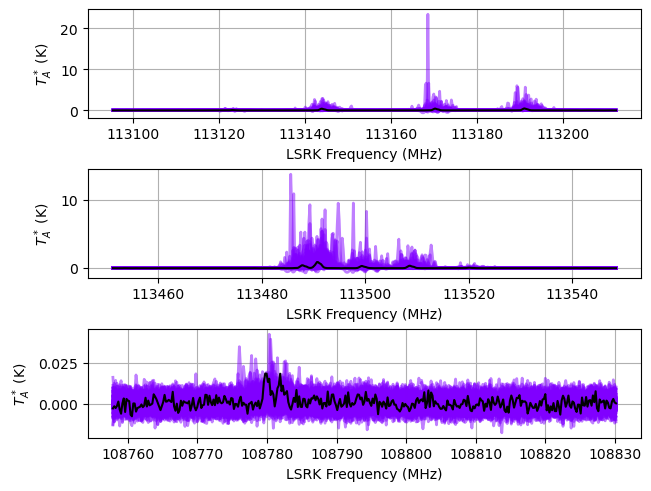

In [29]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=100,  # prior predictive samples
)
_ = plot_predictive(model.data, prior.prior_predictive)

In [30]:
start = time.time()
model.fit(
    n = 100_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.01, # VI relative convergence threshold
    abs_tolerance = 0.05, # VI absolute convergence threshold
    learning_rate = 0.01, # VI learning rate
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 15800
Interrupted at 15,799 [15%]: Average Loss = 4,434


Output()

Runtime: 6.62 minutes


Sampling: [12CN-1, 12CN-2, 13CN]


Output()

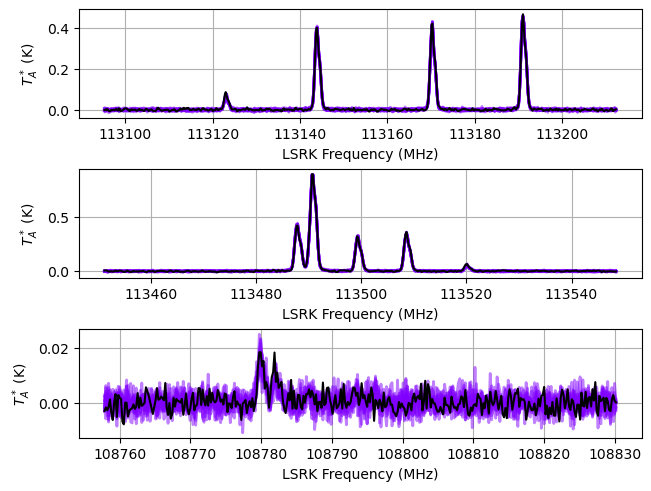

In [31]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [32]:
start = time.time()
model.sample(
    init = "advi+adapt_diag", # initialization strategy
    tune = 1000, # tuning samples
    draws = 1000, # posterior samples
    chains = 8, # number of independent chains
    cores = 8, # number of parallel chains
    init_kwargs = {"rel_tolerance": 0.01, "abs_tolerance": 0.05, "learning_rate": 0.01}, # VI initialization arguments
    nuts_kwargs = {"target_accept": 0.9}, # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 15800
Interrupted at 15,799 [15%]: Average Loss = 4,434
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, baseline_13CN_norm, velocity_norm, fwhm_nonthermal_norm, fwhm_L_norm, log10_N0_12CN_norm, log10_N0_13CN_norm, log10_inv_boltz_factor_free_12CN, log10_Tex_13CN_norm]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 14699 seconds.


Adding log-likelihood to trace


Output()

Runtime: 253.81 minutes


In [33]:
model.solve(kl_div_threshold=0.1)

GMM converged to unique solution


In [34]:
print("solutions:", model.solutions)

# ignore transition and state dependent parameters
pm.summary(model.trace.posterior, var_names=model.cloud_deterministics + model.hyper_deterministics + model.baseline_freeRVs)

solutions: [0]


/opt/conda/envs/bayes_cn_hfs-dev/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
velocity[0],0.635,0.010,0.616,0.655,0.000,0.000,4988.0,5580.0,1.00
velocity[1],1.409,0.024,1.362,1.452,0.000,0.000,3492.0,4926.0,1.00
velocity[2],-0.846,0.025,-0.893,-0.800,0.000,0.000,3273.0,4562.0,1.00
fwhm_thermal_12CN[0],0.236,0.000,0.236,0.236,0.000,0.000,8000.0,8000.0,NaN
fwhm_thermal_12CN[1],0.236,0.000,0.236,0.236,0.000,0.000,8000.0,8000.0,NaN
fwhm_thermal_12CN[2],0.236,0.000,0.236,0.236,0.000,0.000,8000.0,8000.0,NaN
fwhm_thermal_13CN[0],0.232,0.000,0.232,0.232,0.000,0.000,8000.0,8000.0,NaN
fwhm_thermal_13CN[1],0.232,0.000,0.232,0.232,0.000,0.000,8000.0,8000.0,NaN
fwhm_thermal_13CN[2],0.232,0.000,0.232,0.232,0.000,0.000,8000.0,8000.0,NaN
fwhm_nonthermal[0],1.543,0.052,1.443,1.639,0.001,0.001,1417.0,1466.0,1.01


Sampling: [12CN-1, 12CN-2, 13CN]


Output()

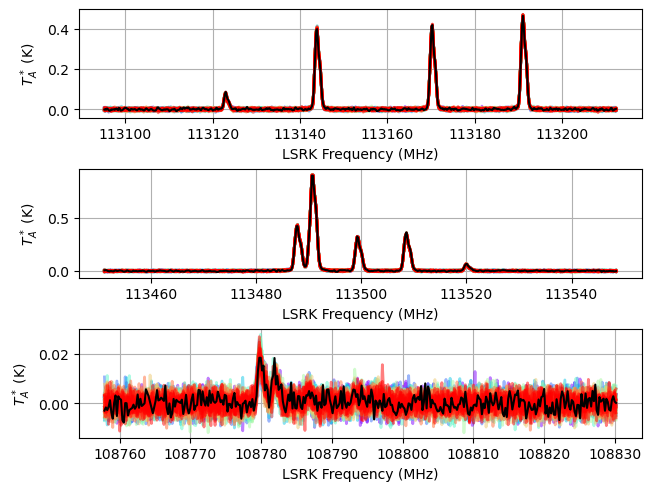

In [35]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

['velocity_norm', 'fwhm_nonthermal_norm', 'log10_N0_12CN_norm', 'log10_N0_13CN_norm', 'log10_inv_boltz_factor_free_12CN', 'log10_Tex_13CN_norm']


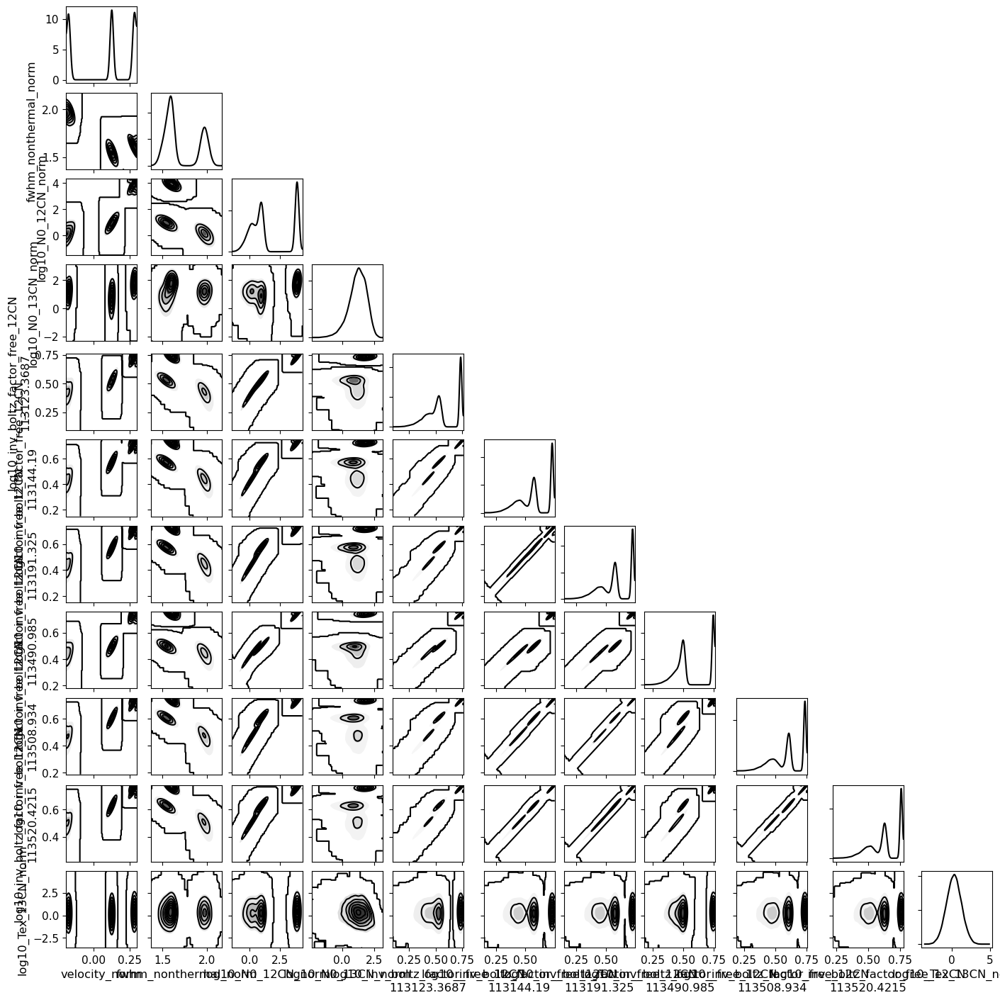

In [36]:
from bayes_spec.plots import plot_pair

var_names = [
    param for param in model.cloud_freeRVs
    if not set(model.model.named_vars_to_dims[param]).intersection(set([
        #"transition_12CN", "transition_free_12CN", "transition_13CN", "transition_free_13CN",
        "state_l_12CN", "state_l_13CN"
    ]))
]
print(var_names)
_ = plot_pair(
    model.trace.solution_0, # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
)